<a href="https://colab.research.google.com/github/z101106/MSc/blob/Spatial-Texts/Project1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv2
from google.colab.patches import cv2_imshow
from skimage import io
from PIL import Image


In [ ]:

from google.colab import drive
drive.mount('/content/drive')

# mounted on MyDrive
!ls '/content/drive/'

Mounted at /content/drive
MyDrive


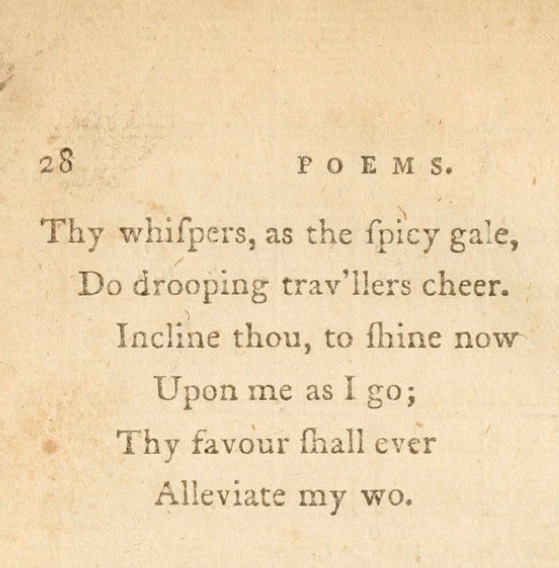

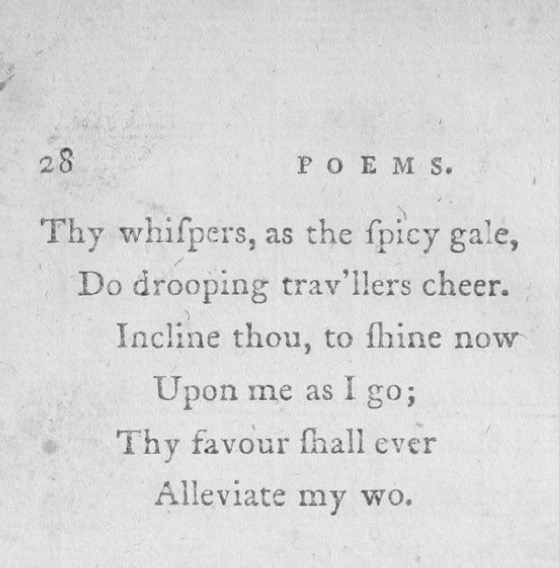

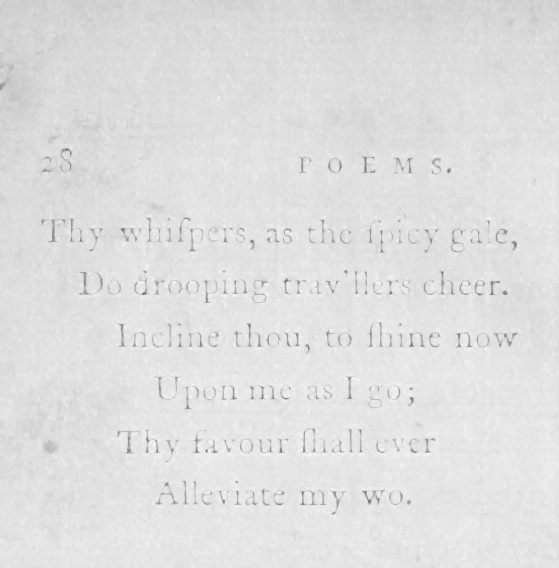

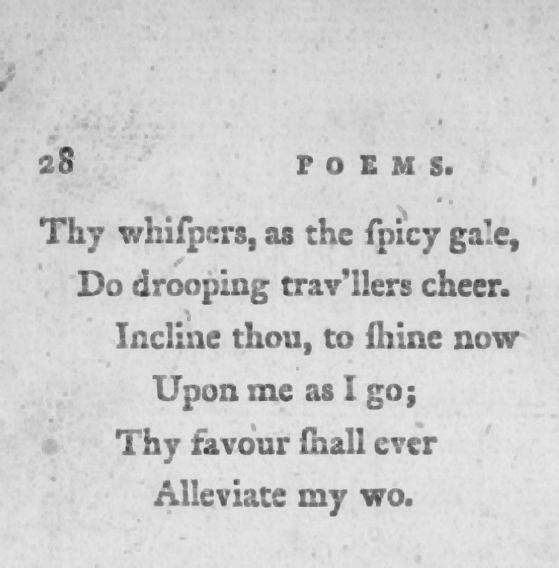

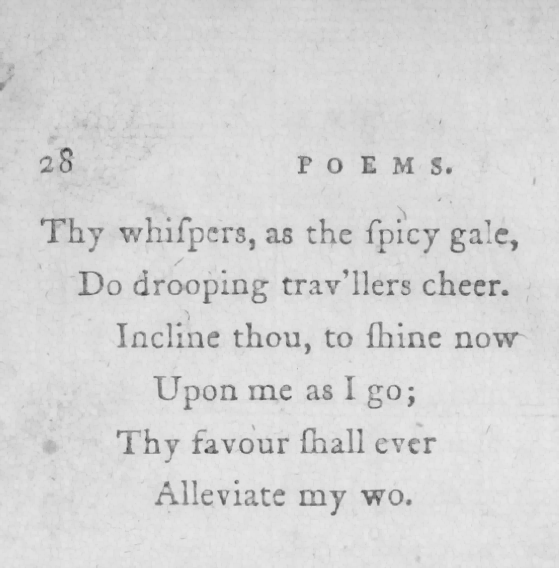

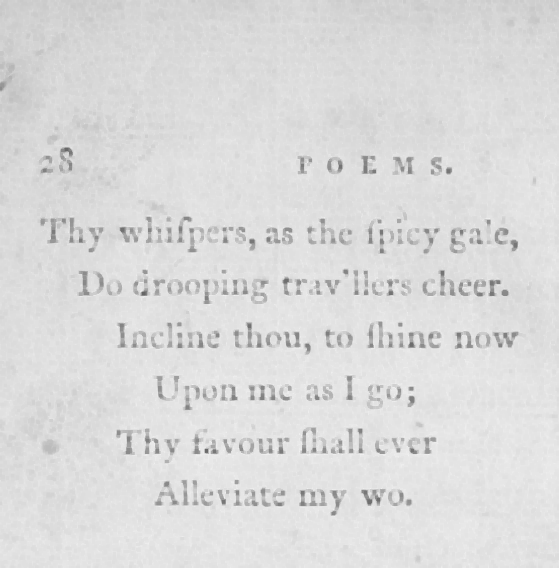

In [ ]:
import cv2
import numpy as np


# Morphological operation
img = cv2.imread("/content/drive/MyDrive/poetry.jpg")
cv2_imshow(img)

# Grayscale image
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_img)

# Dilation operation
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
dilated_img = cv2.dilate(gray_img, kernel, iterations=1)
cv2_imshow(dilated_img)

# Erosion operation
eroded_img = cv2.erode(gray_img, kernel, iterations=1)
cv2_imshow(eroded_img)

# Opening operation
opened_img = cv2.morphologyEx(gray_img, cv2.MORPH_OPEN, kernel)
cv2_imshow(opened_img)

# Closing operation
closed_img = cv2.morphologyEx(gray_img, cv2.MORPH_CLOSE, kernel)
cv2_imshow(closed_img)



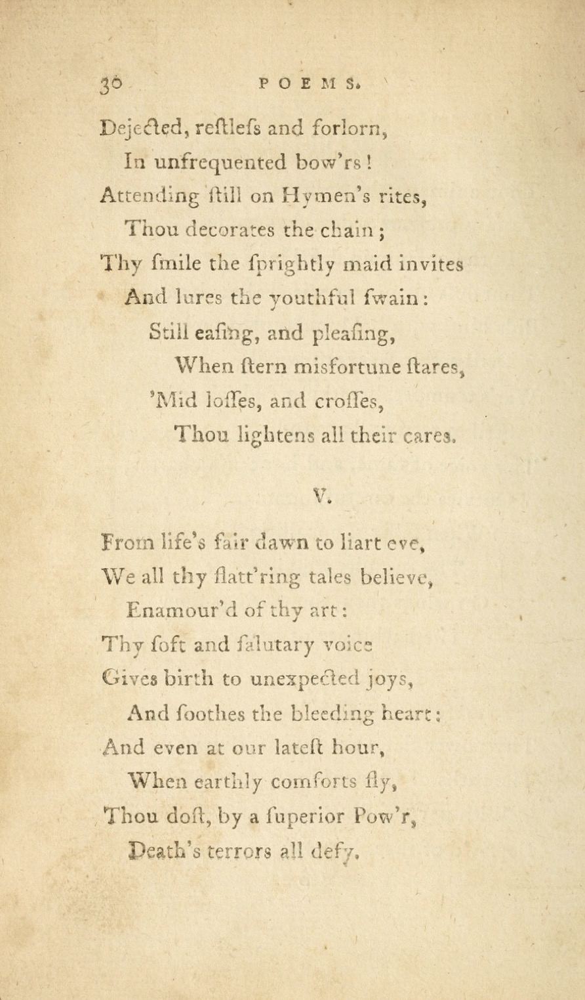

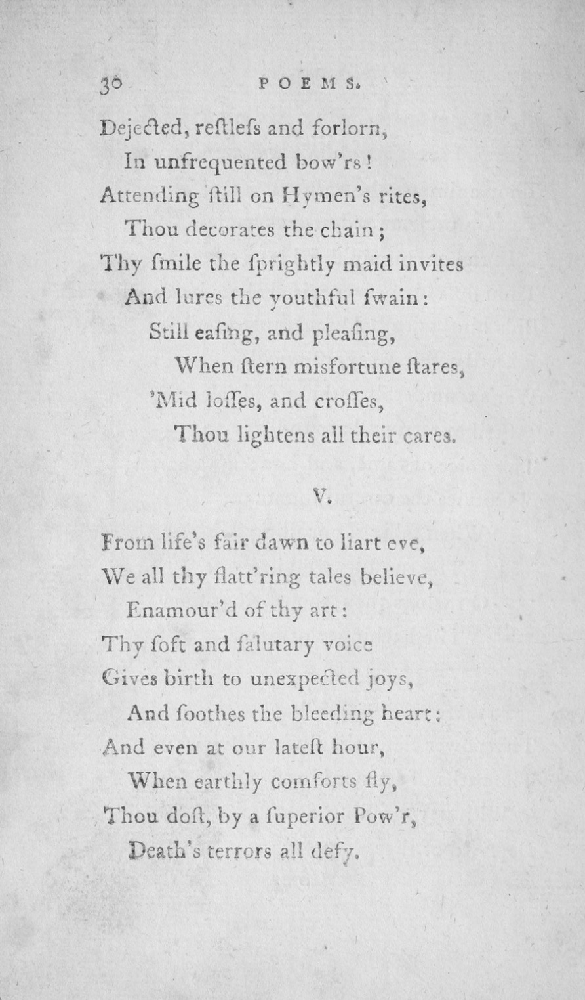

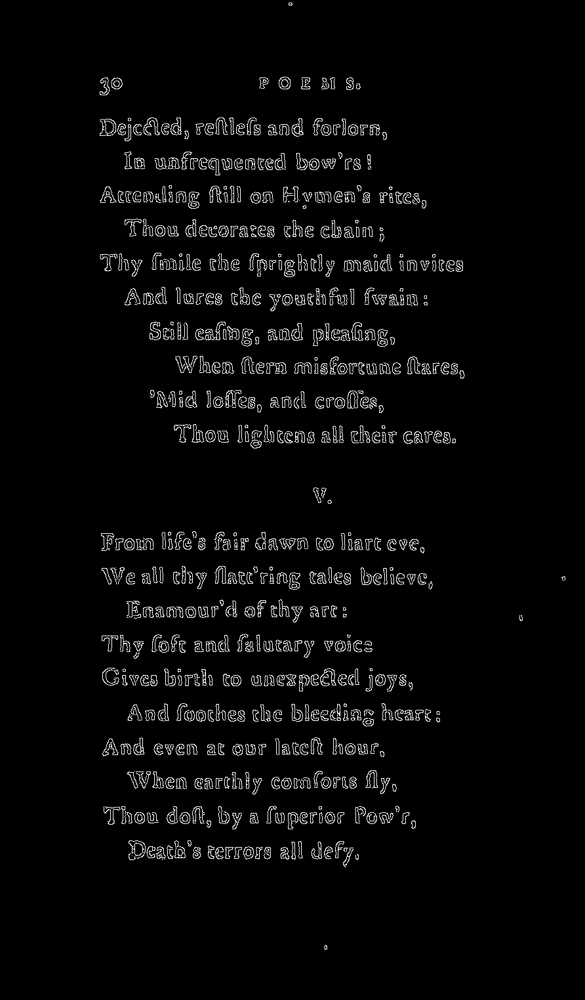

The PSNR value is: 36.16


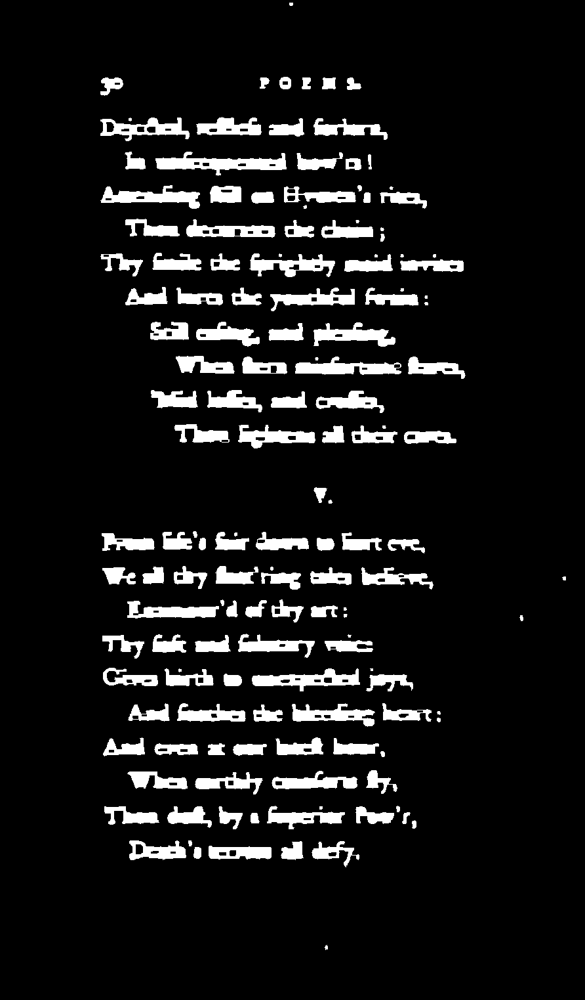

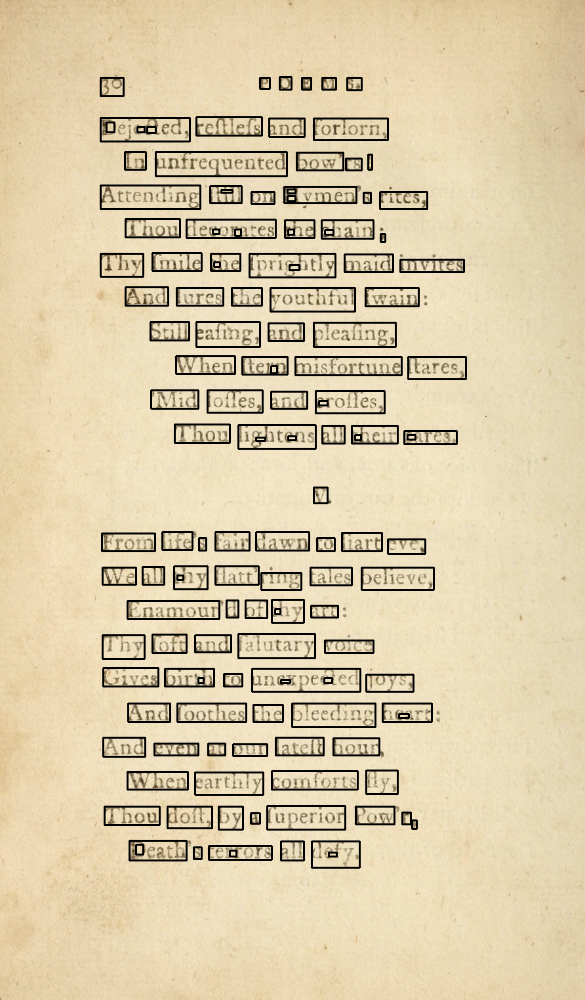

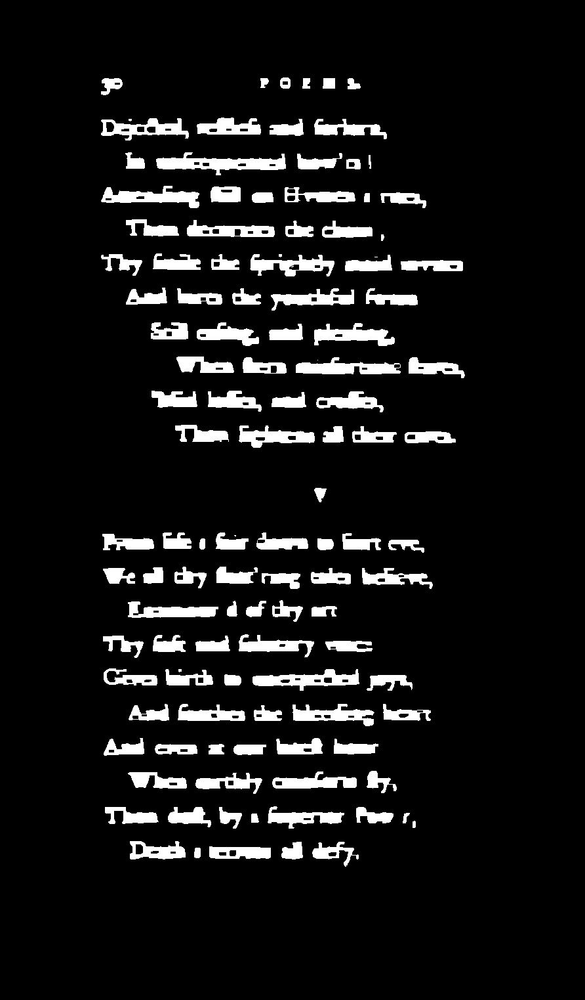

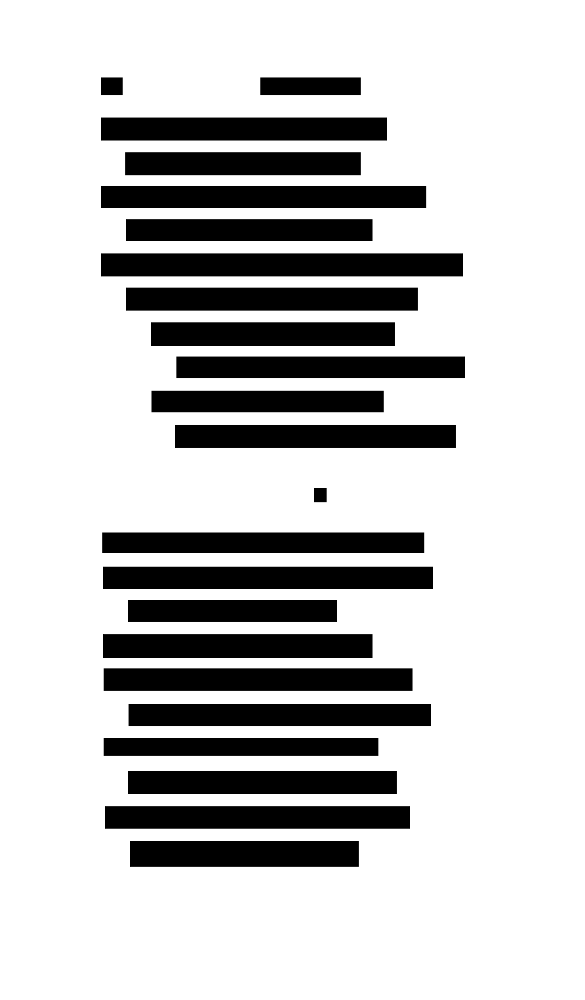

In [ ]:
import cv2
import numpy as np
import cv2 as cv
from more_itertools import collapse
mserdo=1
# Use the MSER algorithm
# read image file
img = cv2.imread("/content/drive/MyDrive/poetry2.jpg")
cv2_imshow(img)
# Grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_img)
cv.imwrite('s1.png', gray_img)

# Noise reduction and edge detection
gray_img_1 = cv2.GaussianBlur(gray_img, (7, 7), 0)

edged = cv2.Canny(gray_img_1, 50, 100)
cv2_imshow(edged)


def calculate_psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr
# Check if two images are the same size
if gray_img.shape != gray_img_1.shape:
    raise ValueError("Both images must be the same size")

psnr_value = calculate_psnr(gray_img, gray_img_1)
print(f"The PSNR value is: {psnr_value:.2f}")

# Morphological closing operation
kernel = np.ones((3, 8), np.uint8)
closeing_img = cv2.dilate(edged, kernel, iterations=1)
closeing_img = cv2.erode(closeing_img, kernel, iterations=1)
cv2_imshow(closeing_img)

# Create MSER detector
if mserdo==1:
    mser = cv2.MSER_create()

    # Detect text area
    regions, _ = mser.detectRegions(closeing_img)
    mser_img = img.copy()
    for region in regions:
        x, y, w, h = cv2.boundingRect(region)
        mser_img = cv2.rectangle(mser_img, (x, y), (x + w, y + h), (0, 0, 0), thickness=2)
    cv2_imshow(mser_img)
    hulls = [cv2.convexHull(p.reshape(-1, 1, 2)) for p in regions]
    cv2.polylines(closeing_img, hulls, 1, (0, 255, 0))

    mask = np.zeros((closeing_img.shape[0], closeing_img.shape[1], 1), dtype=np.uint8)
    for contour in hulls:
        cv2.drawContours(mask, [contour], -1, (255, 255, 255), -1)
    text_only = cv2.bitwise_and(closeing_img, closeing_img, mask=mask)
    cv2_imshow(text_only)
    cv.imwrite('mser_text_only.png', text_only)
    closeing_img=text_only
# Calculate Vertical Projection
vertical_projection = np.sum(closeing_img, axis=1)

# Divide text area into separate lines according to vertical projection
lines = []
current_line = []
for i in range(len(vertical_projection)):
    if vertical_projection[i] > 0:
        if len(current_line) == 0:
            current_line.append(i)
        else:
            if i - current_line[-1] > 10:
                lines.append(current_line)
                current_line = [i]
            else:
                current_line.append(i)
    elif len(current_line) > 0:
        lines.append(current_line)
        current_line = []

# Divide each line of text area into independent text blocks according to horizontal projection
text_blocks = []
for line in lines:
    line_img = closeing_img[line[0]:line[-1], :]
    horizontal_projection = np.sum(line_img, axis=0)
    blocks = []
    current_block = []
    for j in range(len(horizontal_projection)):
        if horizontal_projection[j] > 0:
            if len(current_block) == 0:
                current_block.append(j)
            else:
                if j - current_block[-1] > 10:
                    blocks.append(current_block)
                    current_block = [j]
                else:
                    current_block.append(j)
        elif len(current_block) > 0:
            blocks.append(current_block)
            current_block = []
    if len(current_block) > 0:
        blocks.append(current_block)
    text_blocks.append(blocks)

# Connect the text blocks of each line into a complete text line, if the interval is lower than 10% of the x-axis of the picture, it will be spliced
T_x = closeing_img.shape[1] * 0.1
text_lines = []
for line in text_blocks:
    line_blocks = []
    for block in line:
        x1, x2 = block[0], block[-1]
        y1, y2 = lines[text_blocks.index(line)][0], lines[text_blocks.index(line)][-1]
        if (x2 - x1) > closeing_img.shape[1] * 0.01:
            line_blocks.append([x1, y1, x2, y2])
    if len(line_blocks) > 1:
        array = np.array(line_blocks)
        max_y = np.max(array[:, 3])
        min_y = np.min(array[:, 1])
        xdiff = array[1:, 0] - array[:-1, 2]
        ydiff = array[1:, 1] - array[:-1, 3]
        tmp_blocks = array[0]
        for i in range(len(xdiff)):
            if xdiff[i] < T_x:
                tmp_blocks[2] = array[i + 1][2]
            else:
                line_blocks.append([tmp_blocks[0], min_y, tmp_blocks[2], max_y])
                tmp_blocks = array[i + 1]
        line_blocks.append([tmp_blocks[0], min_y, tmp_blocks[2], max_y])
    else:
        line_blocks = line_blocks
    text_lines.append(line_blocks)
img[:, :, :] = 255
pix_array = np.array(list(collapse(text_lines))).reshape(-1, 4)
# Characters smaller than 30% of the average line height are regarded as noise
T_y = np.mean(pix_array[:, 3] - pix_array[:, 1]) * 0.3
text_block_count = 0

for line in text_lines:
    for x1, y1, x2, y2 in line:
        if (y2 - y1) > T_y:
            rectangle_img = cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 0), -1)
            text_block_count += 1
# show result image
cv2_imshow(rectangle_img)


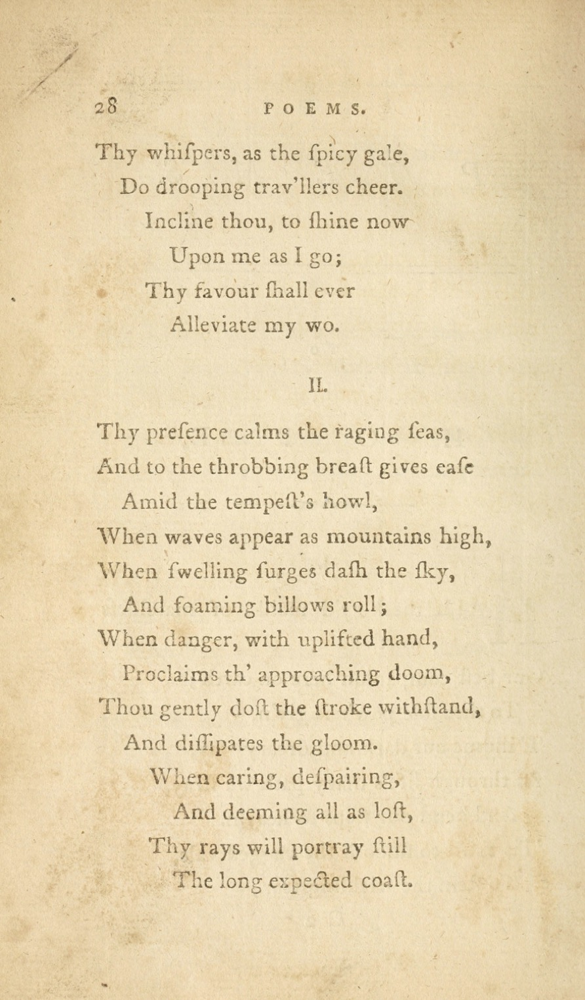

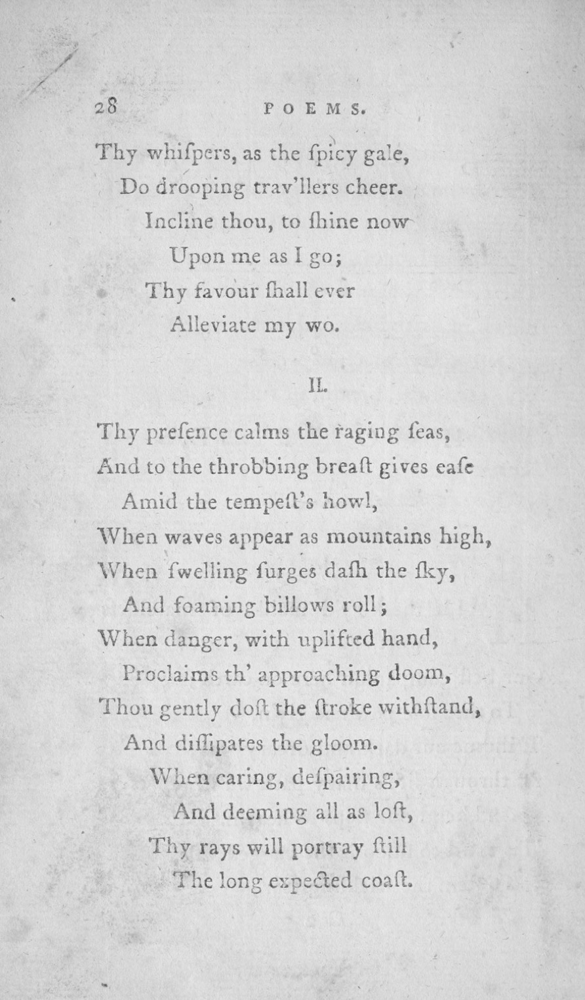

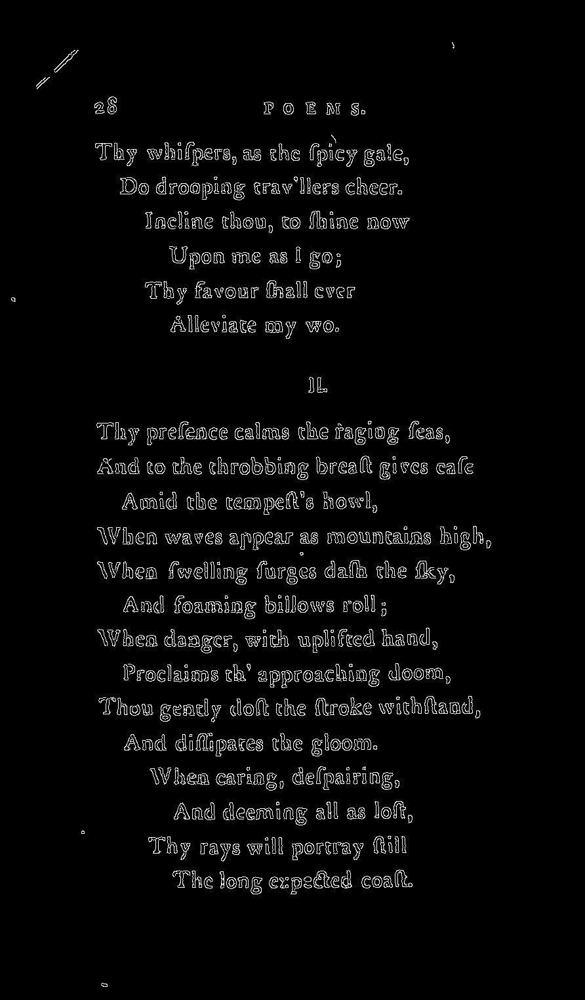

The PSNR value is: 35.82


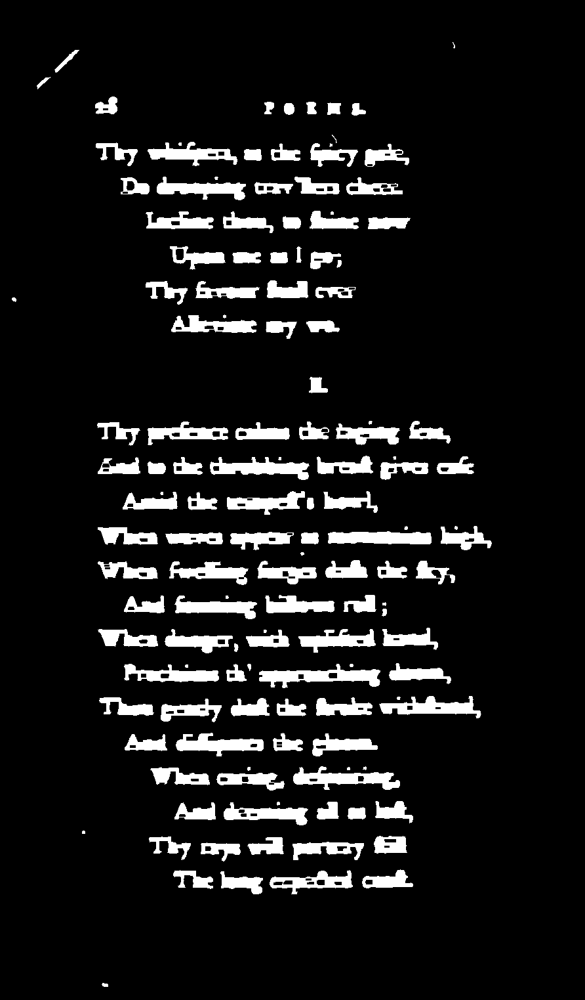

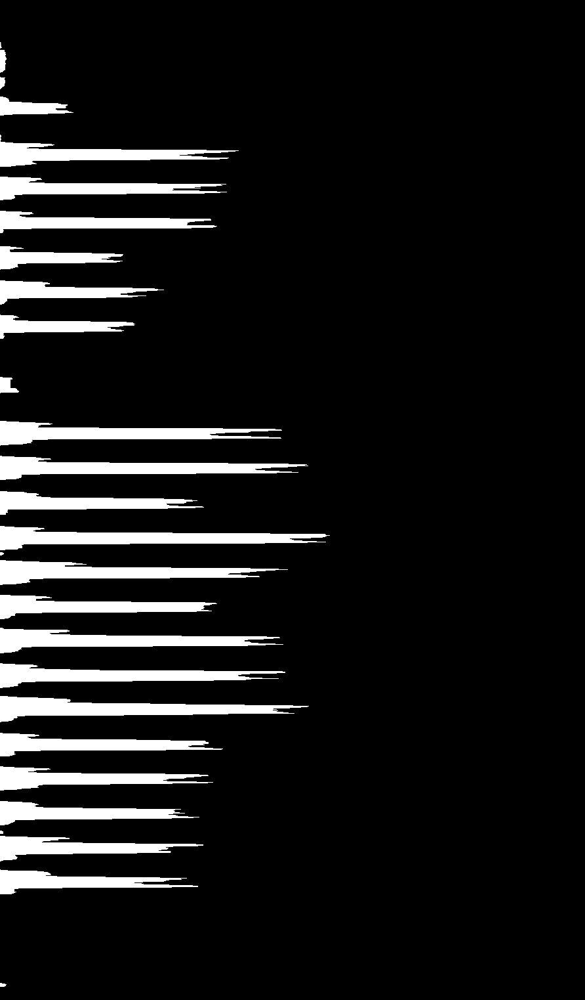

Line 2 and Line 0 have Allen relation: D
Line 2 and Line 1 have Allen relation: M
Line 2 and Line 2 have Allen relation: OVL
Line 2 and Line 3 have Allen relation: OVL
Line 2 and Line 4 have Allen relation: OVL
Line 2 and Line 5 have Allen relation: OVL
Line 2 and Line 6 have Allen relation: D
Line 3 and Line 0 have Allen relation: M
Line 3 and Line 1 have Allen relation: OVL
Line 3 and Line 2 have Allen relation: OVL
Line 3 and Line 3 have Allen relation: OVL
Line 3 and Line 4 have Allen relation: OVL
Line 3 and Line 5 have Allen relation: OVL
Line 4 and Line 0 have Allen relation: M
Line 4 and Line 1 have Allen relation: OVL
Line 4 and Line 2 have Allen relation: OVL
Line 4 and Line 3 have Allen relation: OVL
Line 4 and Line 4 have Allen relation: OVL
Line 5 and Line 0 have Allen relation: M
Line 5 and Line 1 have Allen relation: OVL
Line 5 and Line 2 have Allen relation: OVL
Line 5 and Line 3 have Allen relation: OVL
Line 5 and Line 4 have Allen relation: OVL
Line 6 and Line 0 have 

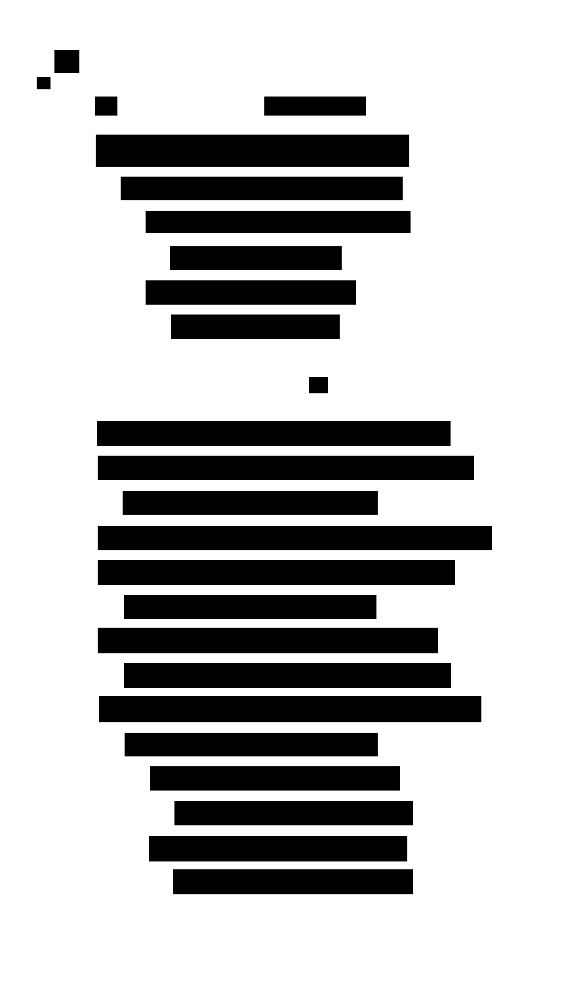

In [ ]:
import cv2
import numpy as np
import cv2 as cv
from more_itertools import collapse
# Use projection method
def allen_relations(text_line):
    relations = {}
    for i, line in enumerate(text_line):
        for j, box_i in enumerate(line):
            for box_j in line[j + 1:]:
                x1_i, y1_i, x2_i, y2_i = box_i
                x1_j, y1_j, x2_j, y2_j = box_j

                if x1_i > x2_j or x1_j > x2_i:  # Check if the boxes are completely left or right to each other
                    relations[(i, j)] = "D"  # Disjoint (no spatial relation)
                elif y1_i > y2_j or y1_j > y2_i:  # Check if the boxes are completely above or below each other
                    relations[(i, j)] = "D"  # Disjoint (no spatial relation)
                elif y1_i < y1_j < y2_i or y1_j < y1_i < y2_j:  # Check if one box is partially above or below the other
                    relations[(i, j)] = "OVL"  # Overlaps
                elif x1_i < x1_j < x2_i or x1_j < x1_i < x2_j:  # Check if one box is partially left or right of the other
                    relations[(i, j)] = "OVL"  # Overlaps
                else:
                    relations[(i, j)] = "M"  # Meets

    return relations

img = cv2.imread("/content/drive/MyDrive/poetry1.jpg")
cv2_imshow(img)
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_img)
cv2.imwrite('s1.png', gray_img)

gray_img_1 = cv2.GaussianBlur(gray_img, (7, 7), 0)

edged = cv2.Canny(gray_img_1, 50, 100)
cv2_imshow(edged)


def calculate_psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr
# Check if two images are the same size
if gray_img.shape != gray_img_1.shape:
    raise ValueError("Both images must be the same size")

psnr_value = calculate_psnr(gray_img, gray_img_1)
print(f"The PSNR value is: {psnr_value:.2f}")

kernel = np.ones((3, 8), np.uint8)
closeing_img = cv2.dilate(edged, kernel, iterations=1)
closeing_img = cv2.erode(closeing_img, kernel, iterations=1)
cv2_imshow(closeing_img)

threshold_img = closeing_img
vertical_projection = np.sum(closeing_img // 255, axis=1)
hori_projection_img = np.zeros_like(threshold_img)
for i in range(len(vertical_projection)):
    for j in range(vertical_projection[i]):
        hori_projection_img[i, j] = 255
cv2_imshow(hori_projection_img)

lines = []
current_line = []
for i in range(len(vertical_projection)):
    if vertical_projection[i] > 0:
        if len(current_line) == 0:
            current_line.append(i)
        else:
            if i - current_line[-1] > 10:
                lines.append(current_line)
                current_line = [i]
            else:
                current_line.append(i)
    elif len(current_line) > 0:
        lines.append(current_line)
        current_line = []

text_blocks = []
for line in lines:
    line_img = closeing_img[line[0]:line[-1], :]
    horizontal_projection = np.sum(line_img, axis=0)
    blocks = []
    current_block = []
    for j in range(len(horizontal_projection)):
        if horizontal_projection[j] > 0:
            if len(current_block) == 0:
                current_block.append(j)
            else:
                if j - current_block[-1] > 10:
                    blocks.append(current_block)
                    current_block = [j]
                else:
                    current_block.append(j)
        elif len(current_block) > 0:
            blocks.append(current_block)
            current_block = []
    if len(current_block) > 0:
        blocks.append(current_block)
    text_blocks.append(blocks)


T_x = closeing_img.shape[1] * 0.1
text_lines = []
for line in text_blocks:
    line_blocks = []
    for block in line:
        x1, x2 = block[0], block[-1]
        y1, y2 = lines[text_blocks.index(line)][0], lines[text_blocks.index(line)][-1]

        if (x2 - x1) > closeing_img.shape[1] * 0.01:
            line_blocks.append([x1, y1, x2, y2])
    if len(line_blocks) > 1:
        array = np.array(line_blocks)
        max_y = np.max(array[:, 3])
        min_y = np.min(array[:, 1])
        xdiff = array[1:, 0] - array[:-1, 2]
        ydiff = array[1:, 1] - array[:-1, 3]
        tmp_blocks = array[0]
        for i in range(len(xdiff)):
            if xdiff[i] < T_x:
                tmp_blocks[2] = array[i + 1][2]
            else:
                line_blocks.append([tmp_blocks[0], min_y, tmp_blocks[2], max_y])
                tmp_blocks = array[i + 1]
        line_blocks.append([tmp_blocks[0], min_y, tmp_blocks[2], max_y])
    else:
        line_blocks = line_blocks
    text_lines.append(line_blocks)
img[:, :, :] = 255
pix_array = np.array(list(collapse(text_lines))).reshape(-1, 4)

# Characters smaller than 30% of the average line height are regarded as noise
T_y = np.mean(pix_array[:, 3] - pix_array[:, 1]) * 0.3
t_lines = []

for line in text_lines:
    line_blocks = []
    for x1, y1, x2, y2 in line:
        if (y2 - y1) > T_y:
            rectangle_img = cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 0), -1)
            line_blocks.append([x1, y1, x2, y2])
            #print(f"Text block: x1={x1}, y1={y1}, x2={x2}, y2={y2}")
    if line_blocks:
        t_lines.append(line_blocks)
# Analyzing the Allan Relationship Between Lines
relations = allen_relations(t_lines)


# print allen relation result
for pair, relation in relations.items():
    i, j = pair
    print(f"Line {i} and Line {j} have Allen relation: {relation}")

cv2_imshow(rectangle_img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

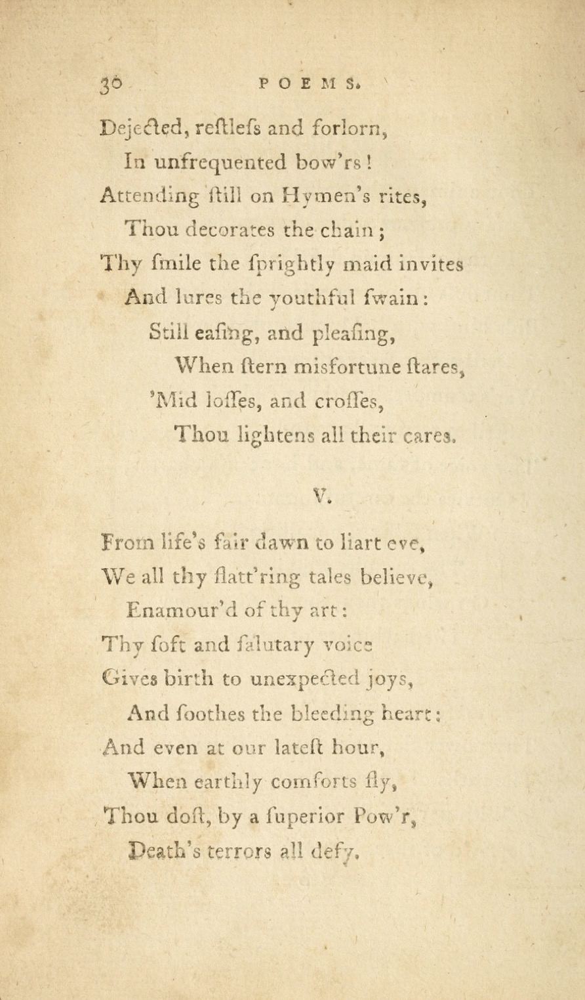

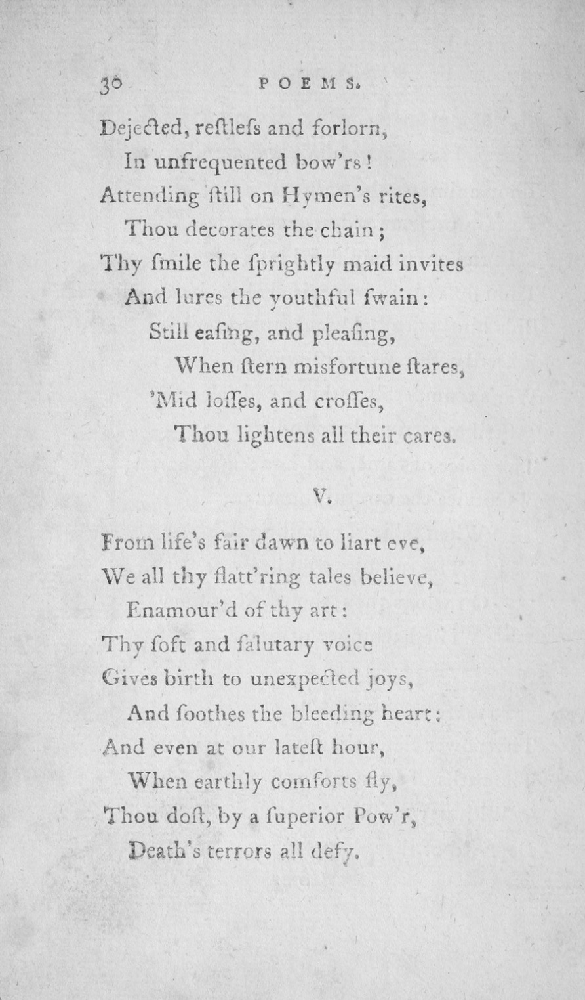

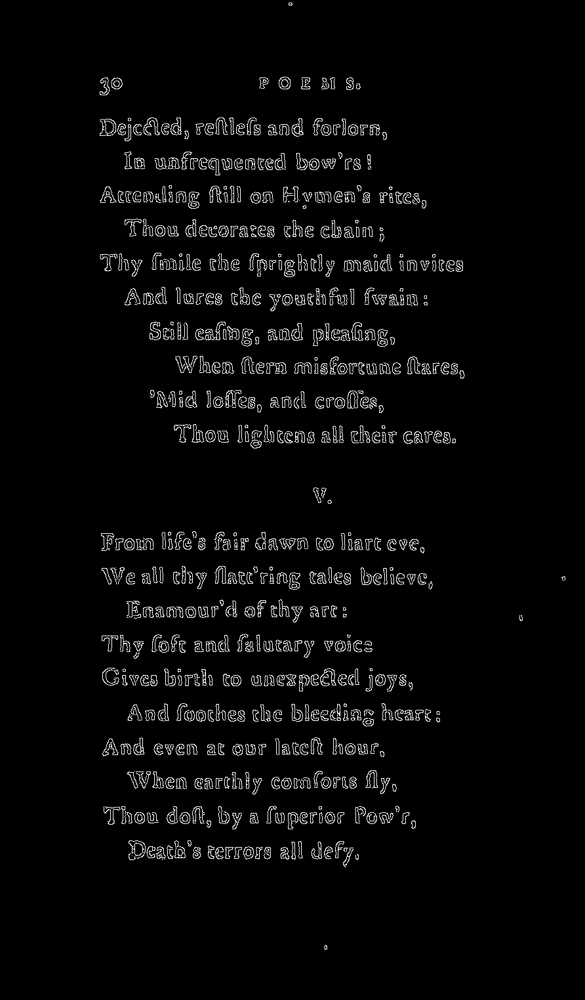

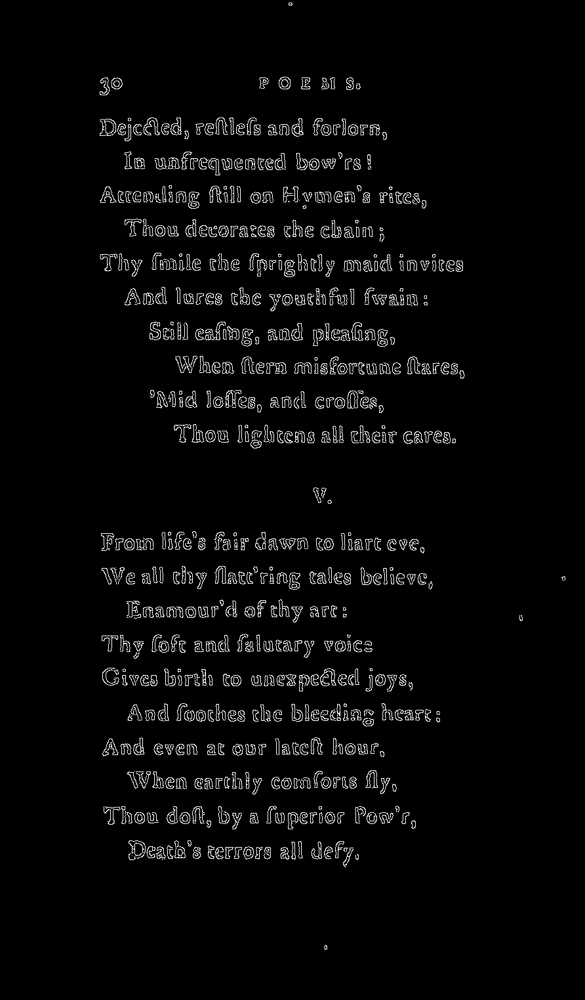

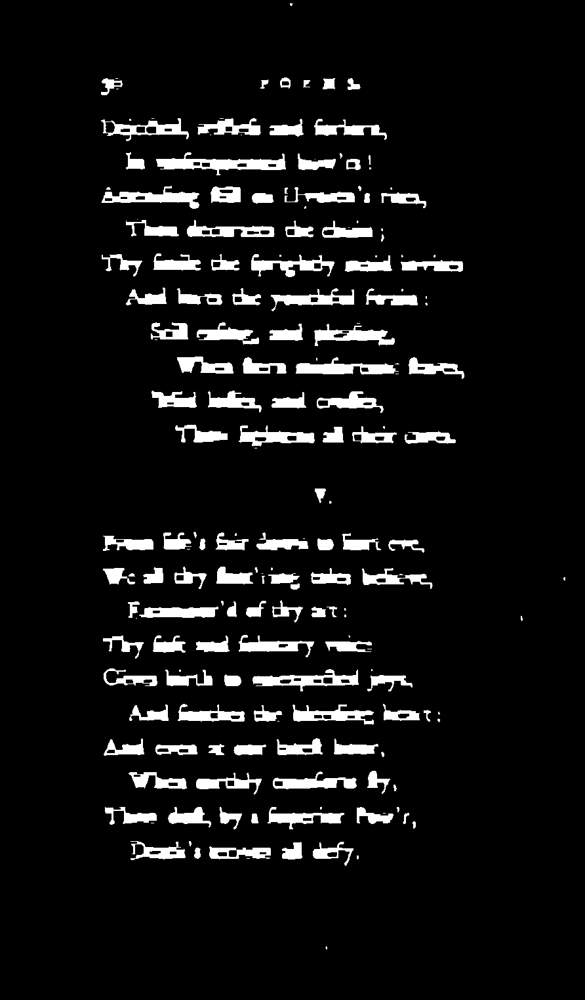

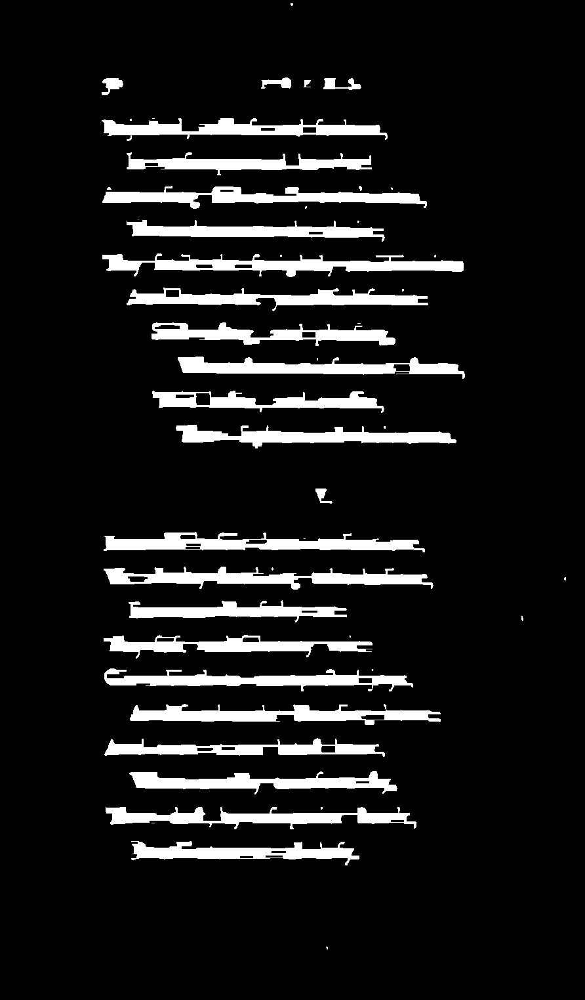

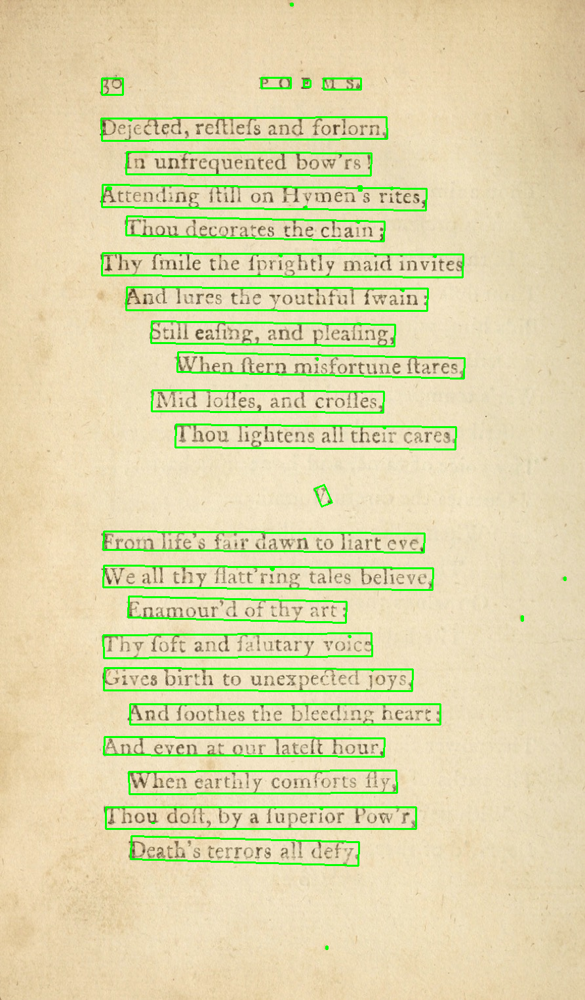

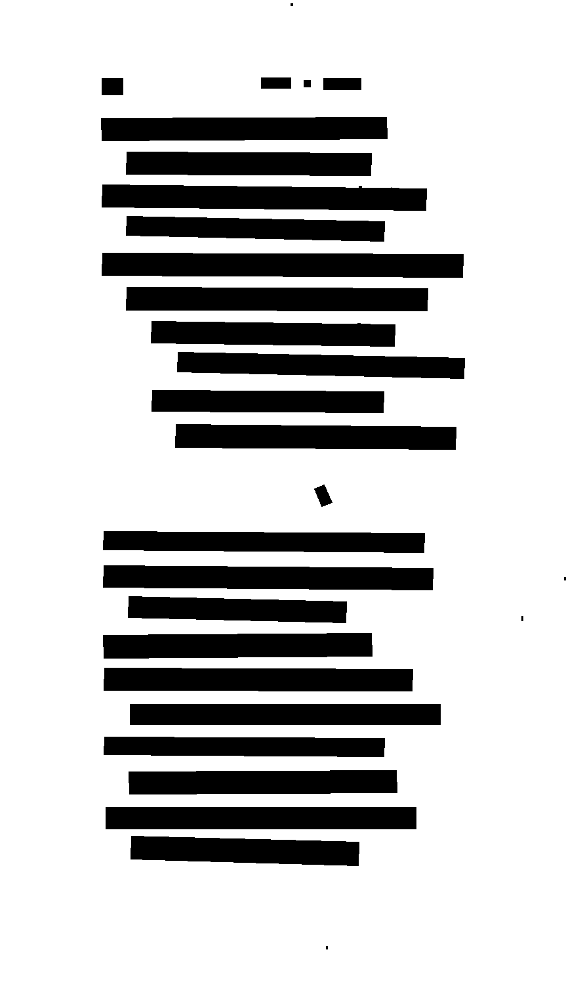

In [18]:
import cv2
import numpy as np

# Use connected component method

img = cv2.imread("/content/drive/MyDrive/poetry2.jpg")
cv2_imshow(img)

gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_img)


gray_img=cv2.GaussianBlur(gray_img,(7,7),0)
edged=cv2.Canny(gray_img,50,100)
cv2_imshow(edged)

# Run the Hough line transform to detect lines in the image, where the parameters are edge image, distance resolution,
# angle resolution and threshold, and return a list of lines detected in the image
lines = cv2.HoughLinesP(edged, 1, np.pi/180, threshold=100, minLineLength=60, maxLineGap=10)

mask = np.ones(edged.shape[:2], dtype=np.uint8) * 255

# Draw the detected lines and remove them from the mask
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]# Detect linear coordinates
        angle = np.arctan2(y2 - y1, x2 - x1) * 180 / np.pi# Calculate line angle
        if np.abs(angle) > 30 and np.abs(angle) < 150:  # Sets the angle threshold for vertical lines
            cv2.line(mask, (x1, y1), (x2, y2), 0, thickness=2)# draw line

# Apply a mask to the original image, removing the lines
edged = cv2.bitwise_and(edged, edged, mask=mask)
cv2_imshow(edged)
# Connect edges using morphological closing
kernel=np.ones((3,8),np.int8)
kernel3=cv2.getStructuringElement(cv2.MORPH_RECT,(1,8))
kernel1=cv2.getStructuringElement(cv2.MORPH_RECT,(10,3))
kernel2=cv2.getStructuringElement(cv2.MORPH_RECT,(8,2))

kernelLine=cv2.getStructuringElement(cv2.MORPH_RECT,(5,1))
kernellian=cv2.getStructuringElement(cv2.MORPH_RECT,(20,3))

closeing_img=cv2.dilate(edged,kernel2,iterations=1)# Dilation operation, expanding the bright area and narrowing the edge gap
closeing_img=cv2.erode(closeing_img,kernel1,iterations=1) #Use erosion to shrink bright areas and remove vertical lines
cv2_imshow(closeing_img)

closeing_img=cv2.morphologyEx(closeing_img,cv2.MORPH_CLOSE,kernellian)# Dilation followed by corrosion helps connect broken edges
cv2_imshow(closeing_img)

useConnected= True
if useConnected:
    # Create a blank image for drawing row dividers
    result = np.copy(img)
    text_rect = []
    text_contours=[]
    # Perform Connected Components Analysis
    _, labels, stats, _ = cv2.connectedComponentsWithStats(closeing_img, connectivity=4)
    contours,_ = cv2.findContours(closeing_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for contour in contours:

        # Calculate the convex hull
        hull = cv2.convexHull(contour)
        # Get the smallest bounding rectangle
        rect = cv2.minAreaRect(hull)
        box = cv2.boxPoints(rect)
        box = np.int0(box)
        text_contours.append([box])
    # Draw the bounding rectangle on the result image
        cv2.drawContours(result, [box], 0, (0, 255, 0), 2)  # Draw the rectangle in green color

    # Store the detected text contour in the list
        text_contours.append([box])

    # Display the result image
    cv2_imshow(result)
else:
    threshold_img=closeing_img

    gray_value_x = np.sum(threshold_img // 255, axis=1)
    # gray_value_x[gray_value_x<15]=0
    print("horizontal projection：", gray_value_x)
    hori_projection_img = np.zeros_like(threshold_img)
    for i in range(len(gray_value_x)):
        for j in range(gray_value_x[i]):
            hori_projection_img[i, j] = 255
    cv2_imshow(hori_projection_img)

    text_rect = []

    inline_x = 0
    start_x = 0
    text_rect_x = []
    for i in range(len(gray_value_x)):
        if inline_x == 0 and gray_value_x[i] > 10:
            inline_x = 1
            start_x = i
        elif inline_x == 1 and (gray_value_x[i] < 10 or i == len(gray_value_x) - 1):
            inline_x = 0
            if i - start_x >= 0:
                rect = [start_x - 1, i + 1]
                text_rect_x.append(rect)
    print(text_rect_x)


    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (13, 3))
    dilate_img = cv2.dilate(threshold_img, kernel)

    for rect in text_rect_x:
        cropImg = dilate_img[rect[0]:rect[1], :]
        sp_y = cropImg.shape

        gray_value_y = np.sum(cropImg // 255, axis=0)

        veri_projection_img = np.zeros_like(cropImg)
        for i in range(len(gray_value_y)):
            for j in range(gray_value_y[i]):
                veri_projection_img[j, i] = 255
        # cv2_imshow(veri_projection_img)

        inline_y = 0
        start_y = 0
        text_rect_y = []
        for i in range(len(gray_value_y)):
            if inline_y == 0 and gray_value_y[i] > 2:
                inline_y = 1
                start_y = i
            elif inline_y == 1 and gray_value_y[i] < 5 and (i - start_y) > 5:
                inline_y = 0
                if i - start_y > 10:
                    rect_y = [start_y - 1, i + 1]
                    text_rect_y.append(rect_y)
                    text_rect.append([rect[0], rect[1], start_y - 1, i + 1])
                    cropImg_rect = threshold_img[rect[0]:rect[1], start_y - 1:i + 1]
                    cropImg_rect = cv2.bitwise_not(cropImg_rect)
if text_rect:
    rectangle_img = img.copy()

    white_img = np.ones_like(rectangle_img) * 255

    rectangle_img[:, :, :] = white_img
    #rectangle_img = img.copy()
    for rect_roi in text_rect:
        rectangle_img = cv2.rectangle(rectangle_img, (rect_roi[2], rect_roi[0]), (rect_roi[3], rect_roi[1]), (0, 0, 0), thickness=-1)
    cv2_imshow(rectangle_img)
elif text_contours:
    rectangle_img = img.copy()

    white_img = np.ones_like(rectangle_img) * 255

    rectangle_img[:, :, :] = white_img

     # rectangle_img = img.copy()
    text_block_count = 0
    for rect_roi in text_contours:
        rectangle_img = cv2.drawContours(rectangle_img, rect_roi , 0,(0, 0, 0), thickness=-1)
        text_block_count += 1
    cv2_imshow(rectangle_img)

else:
    print("No text rectangles found.")

key = cv2.waitKey(0)
if key == 27:
    print(key)
    cv2.destroyAllWindows()

In [ ]:
import cv2

# Cross Validation Selection Parameters
gray_img = cv2.imread("/content/drive/MyDrive/poetry.jpg")

# Canny edge detection using different threshold combinations
for low_threshold in range(10, 100, 10):
    for high_threshold in range(low_threshold + 10, 200, 10):
        # Perform Canny edge detection
        edged = cv2.Canny(gray_img, low_threshold, high_threshold)


        # Show edge detection results
        cv2_imshow(edged)
        cv2.waitKey(0)
        cv2.destroyAllWindows()